<a href="https://colab.research.google.com/github/anil50prasad/hello-world/blob/master/6th_June_Transfer_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%tensorflow_version 2.x

In [0]:
import tensorflow as tf


In [8]:
tf.__version__

'2.2.0'

In [0]:
from tensorflow.keras.applications import VGG16

In [12]:
vgg_model=VGG16()

553467904/553467096 [==============================] - 5s 0us/step


In [13]:
type(vgg_model)

tensorflow.python.keras.engine.training.Model

In [14]:
vgg_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

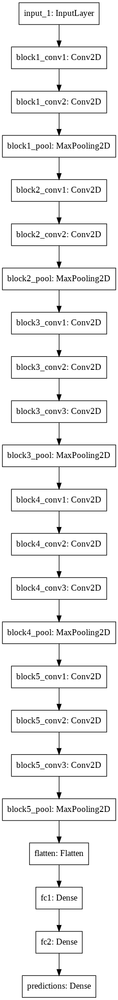

In [16]:
from tensorflow.keras.utils import plot_model
plot_model(vgg_model)

In [0]:
conv_layers=vgg_model.layers[1]


In [22]:
conv_layers.name

'block1_conv1'

In [23]:
conv_layers.filters

64

In [24]:
conv_layers.kernel_size


(3, 3)

In [25]:
conv_layers.kernel.shape

TensorShape([3, 3, 3, 64])

In [27]:
conv_layers.kernel.numpy().min(),conv_layers.kernel.numpy().max()

(-0.67140007, 0.6085159)

In [28]:
conv_layers.kernel[:,:,:,0]  # These are filter values

<tf.Tensor: shape=(3, 3, 3), dtype=float32, numpy=
array([[[ 0.42947057,  0.55037946,  0.4800154 ],
        [ 0.373467  ,  0.44007453,  0.4085474 ],
        [-0.06136011, -0.08138704, -0.06514555]],

       [[ 0.27476987,  0.34573907,  0.31047726],
        [ 0.03868078,  0.04063221,  0.05020237],
        [-0.36722335, -0.4535013 , -0.40338343]],

       [[-0.05746817, -0.05863491, -0.05087169],
        [-0.26224968, -0.33066967, -0.2852275 ],
        [-0.35009676, -0.4850302 , -0.41851634]]], dtype=float32)>

In [80]:
!wget https://www.google.com/imgres?imgurl=https%3A%2F%2Fcdn.britannica.com%2F34%2F127334-050-D7D89C52%2Fbluefin-tuna.jpg&imgrefurl=https%3A%2F%2Fwww.britannica.com%2Fanimal%2Fnorthern-bluefin-tuna%2Fimages-videos&tbnid=yo8EhqesV7s_HM&vet=12ahUKEwjP0qTkw-7pAhXZEysKHT2zAD8QMygAegQIARB-..i&docid=a7GzoQTLfmijsM&w=1600&h=686&itg=1&q=britannica.com%2Fbluefin-tuna.jpg&safe=active&ved=2ahUKEwjP0qTkw-7pAhXZEysKHT2zAD8QMygAegQIARB-

--2020-06-07 01:18:15--  https://www.google.com/imgres?imgurl=https%3A%2F%2Fcdn.britannica.com%2F34%2F127334-050-D7D89C52%2Fbluefin-tuna.jpg
Resolving www.google.com (www.google.com)... 172.217.203.104, 172.217.203.99, 172.217.203.103, ...
Connecting to www.google.com (www.google.com)|172.217.203.104|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.google.com/imghp [following]
--2020-06-07 01:18:15--  https://www.google.com/imghp
Reusing existing connection to www.google.com:443.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘imgres?imgurl=https:%2F%2Fcdn.britannica.com%2F34%2F127334-050-D7D89C52%2Fbluefin-tuna.jpg’

imgres?imgurl=https     [ <=>                ]   4.32K  --.-KB/s    in 0s      

2020-06-07 01:18:15 (40.7 MB/s) - ‘imgres?imgurl=https:%2F%2Fcdn.britannica.com%2F34%2F127334-050-D7D89C52%2Fbluefin-tuna.jpg’ saved [4419]



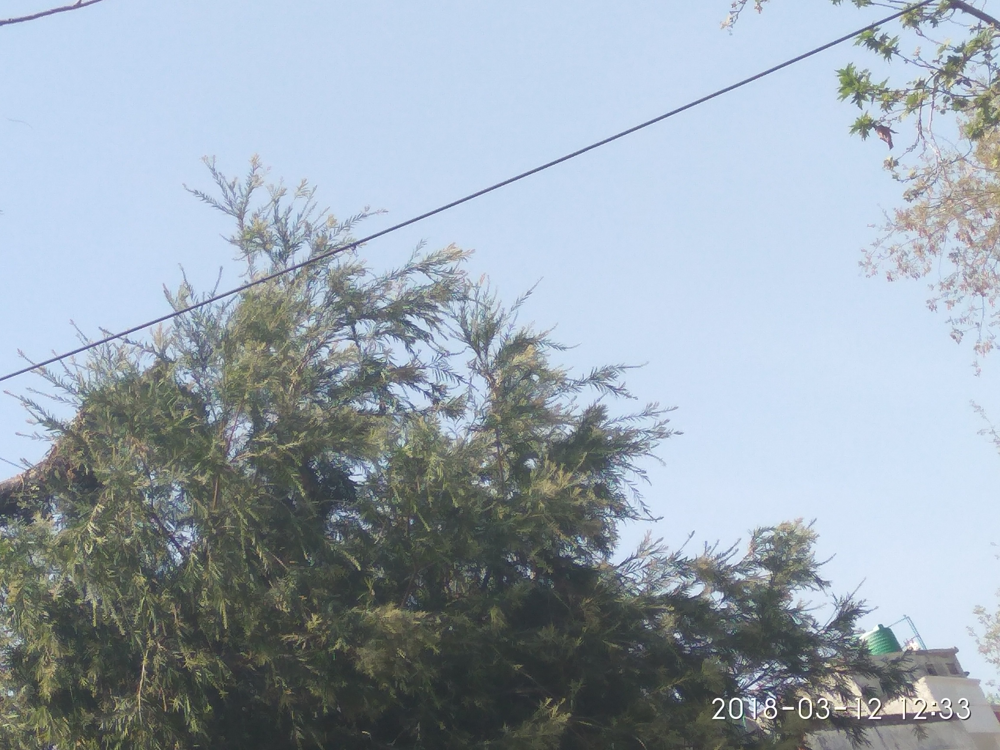

In [86]:
from PIL import Image
Image.open("/content/Tree.jpg")

In [0]:
import cv2



In [0]:
from tensorflow.keras.applications.vgg16 import preprocess_input

In [0]:
test_image=preprocess_input(cv2.imread("/content/Tree.jpg"))

In [0]:
test_image=cv2.imread("/content/Tree.jpg")
test_image=cv2.resize(test_image,(224,224))
test_image=preprocess_input(test_image)

In [71]:
test_image.shape

(224, 224, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


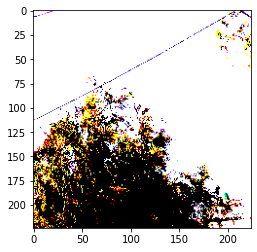

In [72]:
import matplotlib.pyplot as plt
plt.imshow(test_image)

In [0]:
import numpy as np
test_image=np.expand_dims(test_image, axis=0)

In [74]:
test_image.shape

(1, 224, 224, 3)

In [75]:
vgg_model.predict(test_image)

array([[5.29431600e-06, 7.44942517e-05, 1.12008865e-05, 6.65954758e-06,
        2.17641718e-05, 6.18486738e-05, 8.99240476e-05, 2.40023601e-05,
        7.71999657e-06, 3.84286359e-05, 4.90582024e-05, 1.12087619e-05,
        6.50037691e-05, 2.97976167e-05, 2.68664025e-05, 4.51989727e-05,
        7.37428054e-05, 1.49974212e-05, 2.54905928e-04, 1.47675546e-05,
        8.14177201e-06, 1.85049474e-04, 5.56378567e-04, 1.03604456e-03,
        3.24042252e-04, 1.16084448e-05, 6.84307015e-05, 7.03203623e-05,
        3.47362720e-06, 1.31818188e-05, 6.63309675e-06, 4.67827203e-06,
        2.81780808e-06, 1.35038390e-05, 2.08458387e-05, 8.71380507e-06,
        2.34582913e-05, 3.72283580e-06, 8.20326659e-06, 6.46862172e-05,
        1.41772980e-05, 1.31882944e-05, 2.42816805e-05, 8.22392940e-06,
        9.57069005e-06, 2.85487495e-05, 1.32010910e-05, 4.27424202e-05,
        7.17062449e-06, 8.04435513e-06, 4.76584319e-05, 2.55299201e-05,
        5.21500942e-06, 1.55135622e-05, 5.03412957e-06, 1.043469

In [76]:
np.argmax(vgg_model.predict(test_image))

920

In [77]:
tf.keras.applications.vgg16.decode_predictions(
    preds, top=5
)

NameError: ignored

In [78]:
#from tensorflow.keras.applications.vgg16 import decode_predictions
decode_predictions(vgg_model.predict(test_image),top=10)


[[('n06874185', 'traffic_light', 0.15921766),
  ('n03126707', 'crane', 0.133522),
  ('n04346328', 'stupa', 0.12075018),
  ('n03733131', 'maypole', 0.08045833),
  ('n03291819', 'envelope', 0.046141),
  ('n03355925', 'flagpole', 0.03479388),
  ('n04366367', 'suspension_bridge', 0.022455033),
  ('n03976657', 'pole', 0.020960204),
  ('n03837869', 'obelisk', 0.019203931),
  ('n03930313', 'picket_fence', 0.013417332)]]